# Diagnosing Diabetic Retinopathy using Deep Learning Neural Networks

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## Importing Important Libraries

In [1]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import os
import cv2
import sklearn
import tensorflow as tf
from tensorflow import keras
from PIL import Image as im
from glob import glob
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet_v2 import ResNet152V2
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout,MaxPooling2D,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from pathlib import Path
from tqdm.notebook import tqdm
from sklearn import preprocessing
import plotly.express as px 

2023-12-25 01:38:47.665203: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-25 01:38:47.697884: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-25 01:38:47.697915: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-25 01:38:47.699029: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-25 01:38:47.704669: I tensorflow/core/platform/cpu_feature_guar

## Setting up directories

In [2]:
train_root_path ='Data/train'
test_root_path ='Data/test'
validation_path='Data/valid'

## Data Pre-processing

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
shear_range = 0.2,
zoom_range = 0.2,
horizontal_flip = True,
rescale=1./255
)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [4]:
train_set = train_datagen.flow_from_directory(
    'Data/train',
    target_size=(224, 224),
    color_mode="rgb",
    batch_size=32,  
    class_mode='categorical',
    shuffle=True
)

Found 6228 images belonging to 2 classes.


In [5]:
validation_set = test_datagen.flow_from_directory(
    'Data/valid',
    target_size=(224,224),
    color_mode="rgb",
    batch_size=32,  # set as validation data
    class_mode='categorical',
    shuffle=True
)

Found 531 images belonging to 2 classes.


In [6]:
test_set = test_datagen.flow_from_directory(
    'Data/test',
    target_size=(224,224),
    color_mode="rgb",
    batch_size=32,  # set as test data
    class_mode='categorical',
    shuffle=True
)

Found 231 images belonging to 2 classes.


## Checking Data Quality checks

In [7]:
from PIL import Image

# Check readability of images in the training set
for image_path in train_set.filepaths:
    try:
        Image.open(image_path)
    except Exception as e:
        print(f"Error reading image: {image_path}")
        print(f"Error details: {str(e)}")


In [41]:
# Check label consistency in the training set
for image_path in train_set.filepaths:
    expected_label = image_path.split(os.path.sep)[-2]  # Assumes labels are in the second-to-last directory
    actual_label = train_set.class_indices[train_set.classes[train_set.filepaths.index(image_path)]]
    
    if expected_label != actual_label:
        print(f"Mismatched label for image: {image_path}")
        print(f"Expected label: {expected_label}, Actual label: {actual_label}")


KeyError: 0

In [42]:
import os

# Check for missing or corrupted images in the training set
for image_path in train_set.filepaths:
    if not os.path.exists(image_path):
        print(f"Missing image: {image_path}")
    elif os.path.getsize(image_path) == 0:
        print(f"Empty/corrupted image: {image_path}")


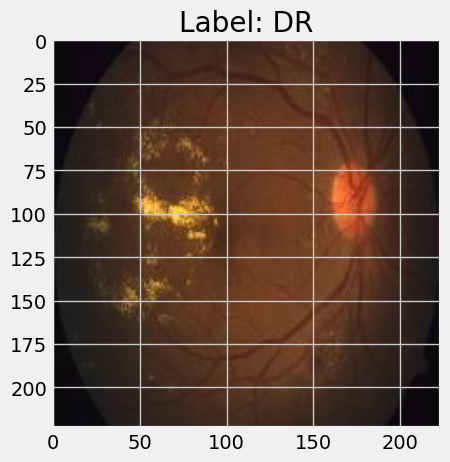

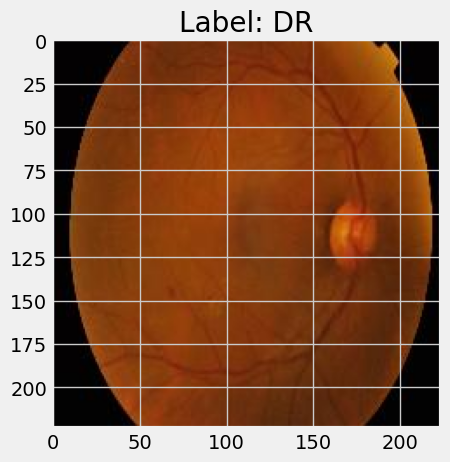

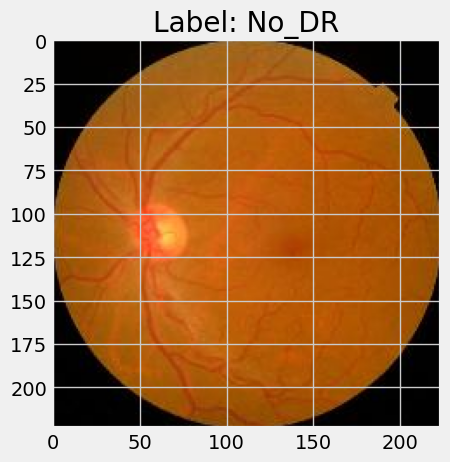

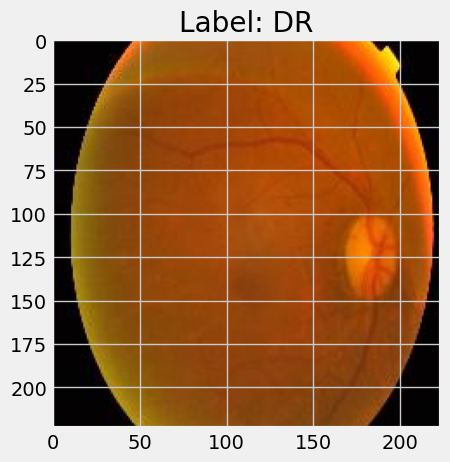

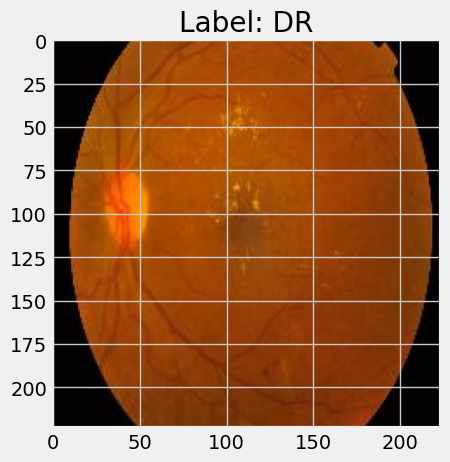

In [43]:
import random
import matplotlib.pyplot as plt

# Visualize a few random images from the training set
sample_images = random.sample(train_set.filepaths, 5)

for image_path in sample_images:
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f"Label: {image_path.split(os.path.sep)[-2]}")
    plt.show()


In [8]:
#Check data type/shape
img= train_set[0]
print(f'Train data type: {type(train_set)}')
print(f'Train data shape: {train_set[0][0].shape}')
print(f'Train classes: {img[1].shape}')

img= validation_set[0]
print(f'\nValid. data type: {type(validation_set)}')
print(f'Valid. data shape: {validation_set[0][0].shape}')
print(f'Valid. classes: {img[1].shape}')

img= test_set[0]
print(f'\nTest data type: {type(test_set)}')
print(f'Test data shape: {test_set[0][0].shape}')
print(f'Test classes: {img[1].shape}')

Train data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Train data shape: (32, 224, 224, 3)
Train classes: (32, 2)

Valid. data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Valid. data shape: (32, 224, 224, 3)
Valid. classes: (32, 2)

Test data type: <class 'keras.src.preprocessing.image.DirectoryIterator'>
Test data shape: (32, 224, 224, 3)
Test classes: (32, 2)


## Data augmentation

In [44]:
def data_aug(img):
    data = []
    for i in range(9):
        img = tf.image.stateless_random_brightness(img,max_delta = 0.02, seed = (1,2))
        img = tf.image.stateless_random_contrast(img,lower = 0.6, upper = 1, seed =(1,3))
        img = tf.image.stateless_random_flip_left_right(img,seed= (np.random.randint(100),np.random.randint(100)))
        img = tf.image.stateless_random_jpeg_quality(img,min_jpeg_quality = 90,max_jpeg_quality=100, seed=(np.random.randint(100),np.random.randint(100)))
        img = tf.image.stateless_random_saturation(img, lower = 0.9, upper = 1, seed =(np.random.randint(100),np.random.randint(100)))
        
        data.append(img)
    
    return data

In [ ]:
# applying data augmentation on both data sets inside the anchor and positive folders
for file_name in os.listdir(os.path.join(ANC_PATH)):
    img_path = os.path.join(ANC_PATH,file_name)
    img = cv2.imread(img_path)
    augmented_images = data_aug(img)
    
    for image in augmented_images:
        cv2.imwrite(os.path.join(ANC_PATH, '{}.jpg'.format(uuid.uuid1())),image.numpy())

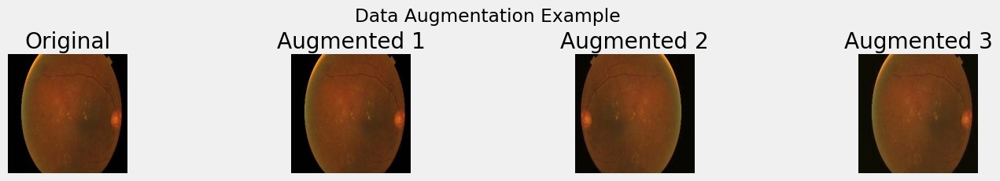

In [49]:
import os
import cv2
import uuid
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Function for data augmentation
def data_aug(img):
    data = []
    for i in range(2):
        img = tf.image.stateless_random_brightness(img, max_delta=0.02, seed=(1, 2))
        img = tf.image.stateless_random_contrast(img, lower=0.6, upper=1, seed=(1, 3))
        img = tf.image.stateless_random_flip_left_right(img, seed=(np.random.randint(100), np.random.randint(100)))
        img = tf.image.stateless_random_jpeg_quality(img, min_jpeg_quality=90, max_jpeg_quality=100,
                                                     seed=(np.random.randint(100), np.random.randint(100)))
        img = tf.image.stateless_random_saturation(img, lower=0.9, upper=1, seed=(np.random.randint(100), np.random.randint(100)))

        data.append(img)

    return data

# Directory path for your train images
ANC_PATH = "Data/train/No_DR"
ANC_PATH_ONE = "Data/train/DR/000c1434d8d7_png.rf.620970d7d209700b4cf09b8f36f52ff9.jpg"

# Function to plot images
def plot_images(images, title):
    fig, axes = plt.subplots(1, len(images) + 1, figsize=(15, 3))
    fig.tight_layout(pad=3.0)  # Adjust the padding between subplots

    axes[0].imshow(images[0])
    axes[0].set_title('Original')
    
    for i in range(1, len(images) + 1):
        axes[i].imshow(images[i - 1])
        axes[i].set_title(f'Augmented {i}')

    for ax in axes:
        ax.axis('off')

    plt.suptitle(title)
    plt.show()

img_path = ANC_PATH_ONE
img = cv2.imread(img_path)

# Reshape the image to (height, width, channels) for visualization
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
augmented_images = data_aug(img)
plot_images([img] + augmented_images, title='Data Augmentation Example')

# Applying data augmentation and plotting
for file_name in os.listdir(ANC_PATH):
    img_path = os.path.join(ANC_PATH, file_name)
    img = cv2.imread(img_path)

    # Reshape the image to (height, width, channels) for visualization
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    augmented_images = data_aug(img)

    # Plotting original and augmented images
    # plot_images([img] + augmented_images, title='Data Augmentation Example')

    # Save augmented images
    for i, image in enumerate(augmented_images):
        cv2.imwrite(os.path.join(ANC_PATH, '{}_{}.jpg'.format(file_name, i)), cv2.cvtColor(image.numpy(), cv2.COLOR_RGB2BGR))


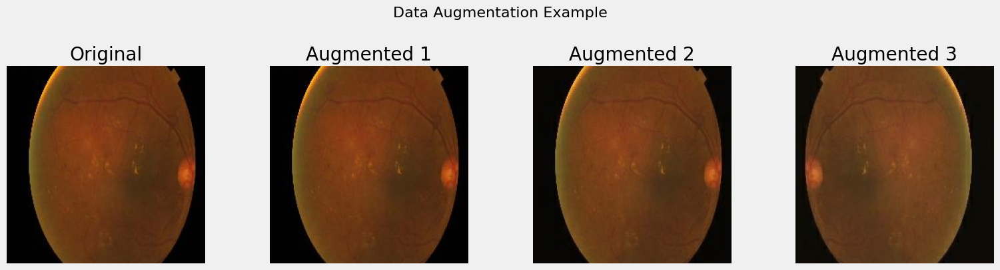

In [50]:
ANC_PATH_ONE = "Data/train/DR/000c1434d8d7_png.rf.620970d7d209700b4cf09b8f36f52ff9.jpg"

# Function to plot images
def plot_images(images, title):
    num_images = len(images)

    fig, axes = plt.subplots(1, num_images + 1, figsize=(16, 4))

    # Original Image
    axes[0].imshow(images[0])
    axes[0].set_title('Original')
    axes[0].axis('off')

    # Augmented Images
    for i in range(1, num_images + 1):
        axes[i].imshow(images[i - 1])
        axes[i].set_title(f'Augmented {i}')
        axes[i].axis('off')

    fig.suptitle(title, y=1.02, fontsize=16)
    plt.tight_layout()
    plt.show()


img_path = ANC_PATH_ONE
img = cv2.imread(img_path)

# Reshape the image to (height, width, channels) for visualization
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
augmented_images = data_aug(img)
plot_images([img] + augmented_images, title='Data Augmentation Example')

## Data Visulization

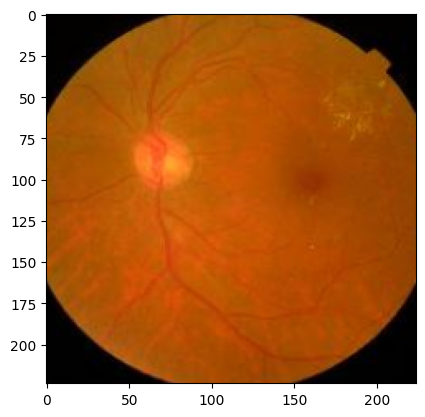

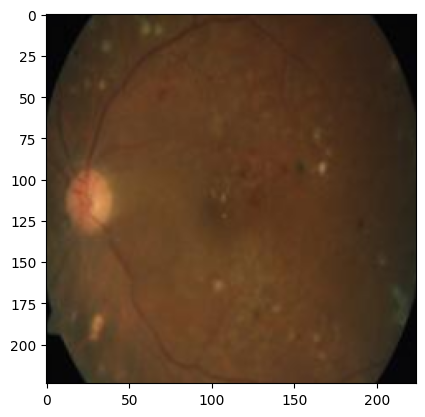

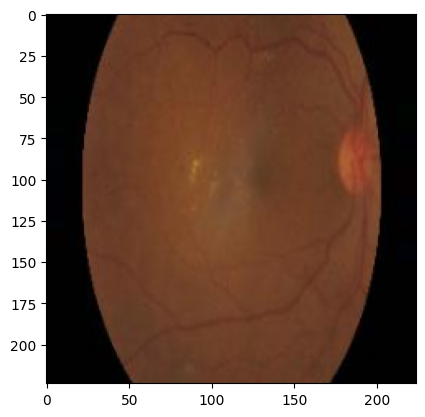

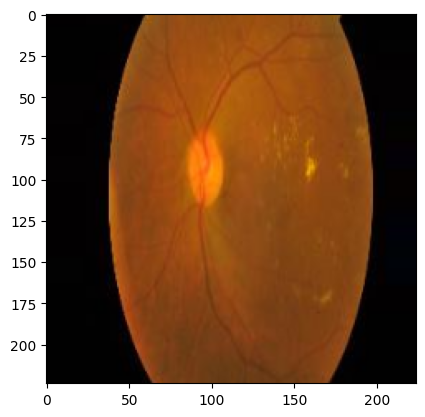

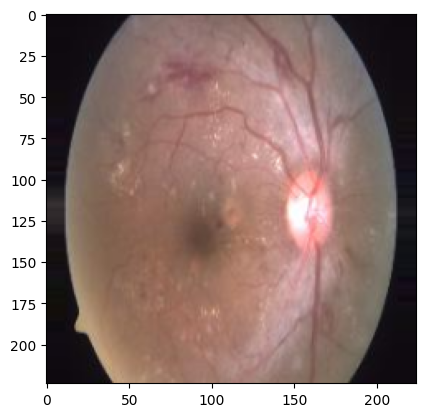

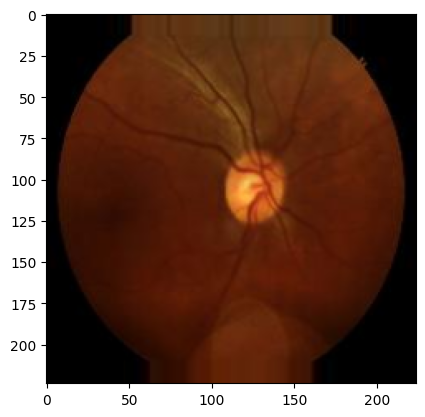

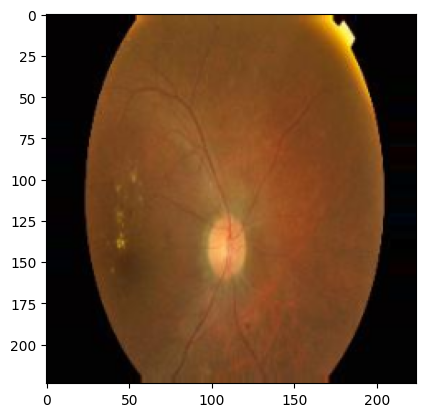

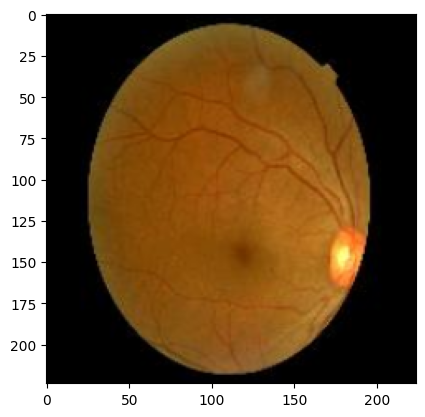

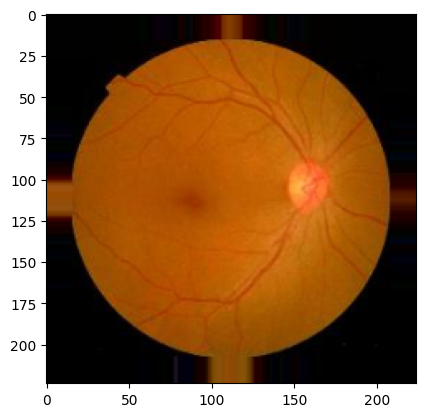

In [8]:
im, la = next(train_set)

for i in range(9):
    plt.imshow(im[i])
    plt.show()

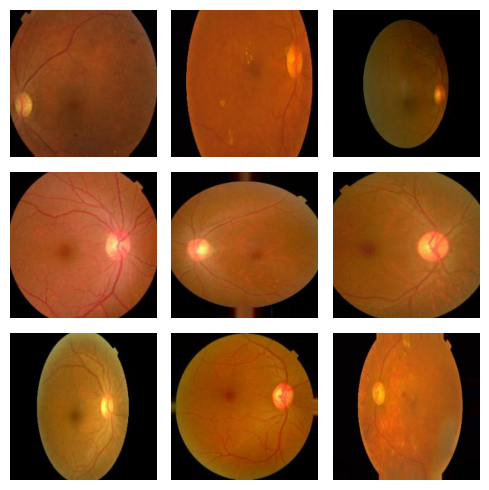

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming im is a list of images
im, la = next(train_set)

# Reshape the data for a 3x3 grid
im_grid = im[:9]

# Create a 3x3 grid of subplots
fig, axes = plt.subplots(3, 3, figsize=(5, 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each image on a subplot
for i in range(len(im_grid)):
    axes[i].imshow(im_grid[i])
    axes[i].axis('off')  # Turn off axis labels

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



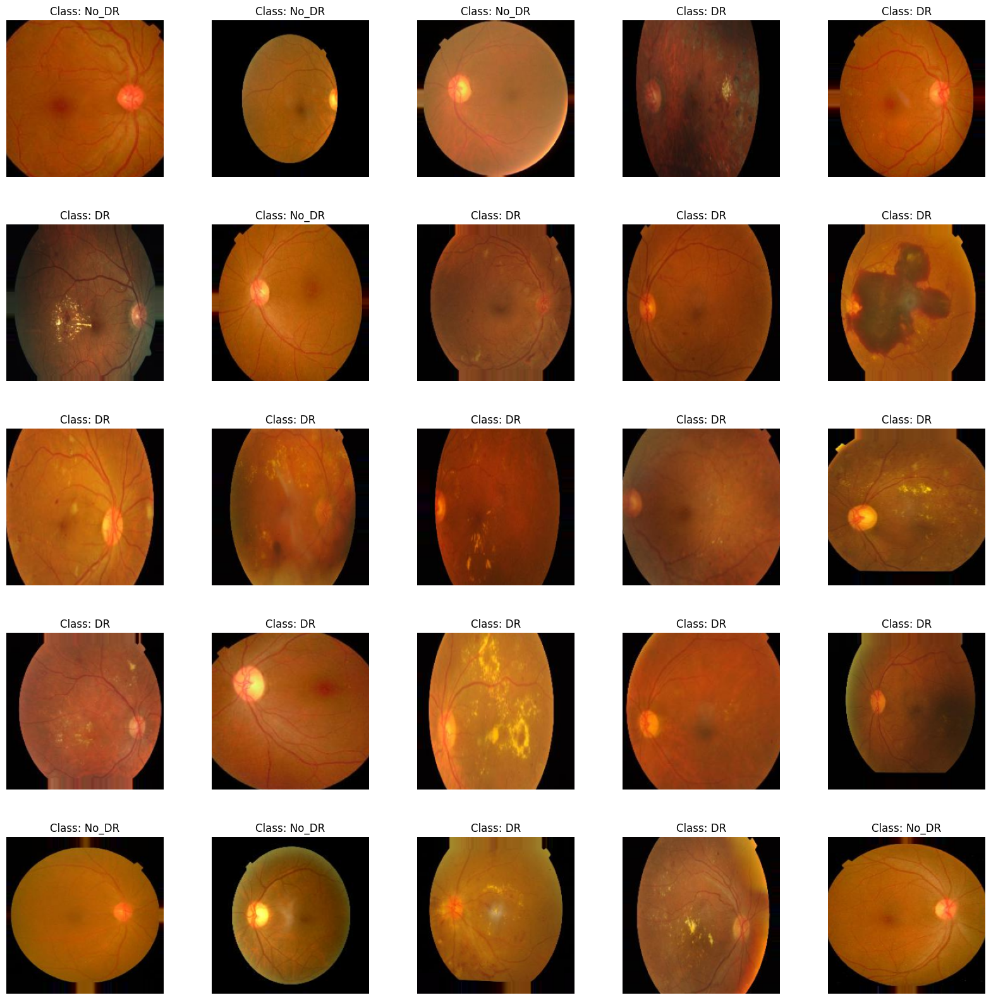

In [17]:
# Display a grid of 25 sample training images with corresponding class labels.
labels = [k for k in train_set.class_indices]
sample_generate = train_set.__next__()

images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(25):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")
    
    
    

Working with 1026 images
Image examples: 
002c21358ce6_png.rf.31ccb999f6cc5cec5b0582cc29aac015.jpg


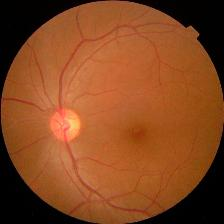

0097f532ac9f_png.rf.a4c88614422d7d7acce8c8a39c20d261.jpg


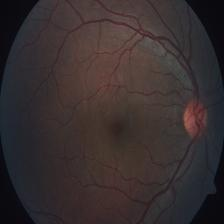

00cc2b75cddd_png.rf.68ceab476d4bc6647b4893a2c71b258f.jpg


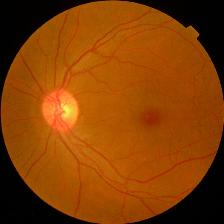

00f6c1be5a33_png.rf.25847756f71abc5d255948442683f4ca.jpg


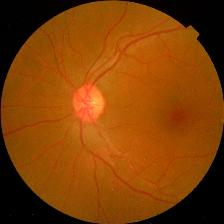

0125fbd2e791_png.rf.2e2da9d99e6edc291b10c50f0a21250d.jpg


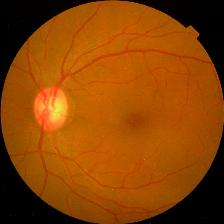

0151781fe50b_png.rf.7ed65941ade797e848a26e26d916634f.jpg


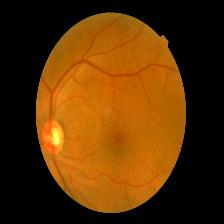

0182152c50de_png.rf.e4a49821f9474aa51fc76c780f671bc4.jpg


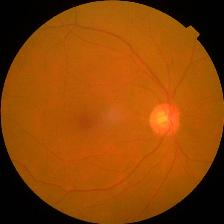

0232dfea7547_png.rf.3253b6d4c9844ee52acb7e6a7f3208ec.jpg


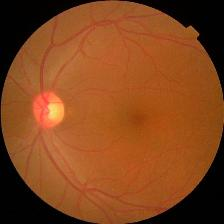

02cd34a85b24_png.rf.73c0c1488235ed5b748dba3480df0f93.jpg


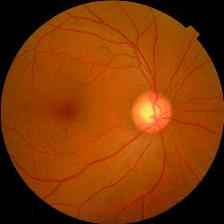

02da652c74b8_png.rf.76ade37ee2018a06e591f33d34eb6b3f.jpg


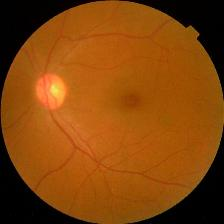

In [18]:
from PIL import Image
import os
from IPython.display import display
from IPython.display import Image as _Imgdis
# creating a object

image_path = "Data/train"
folder = image_path+'/No_DR'



onlybenignfiles = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
print("Working with {0} images".format(len(onlybenignfiles)))
print("Image examples: ")


for i in range(10):
    print(onlybenignfiles[i])
    display(_Imgdis(filename=folder + "/" + onlybenignfiles[i], width=240, height=240))

## Applying Deep Learning Classification models

### Model Transfer Learning : VGG19

In [9]:
BATCH_SIZE = 32
IMAGE_SIZE = [224, 224]
CHANNELS=3
EPOCHS=20

In [10]:
vgg19 = VGG19(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

2023-12-25 01:41:24.258289: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10010 MB memory:  -> device: 0, name: NVIDIA RTX A2000 12GB, pci bus id: 0000:65:00.0, compute capability: 8.6


80134624/80134624 [==============================] - 33s 0us/step


In [11]:
vgg19 = VGG19(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [12]:
for layer in vgg19.layers:
    print(layer)

In [13]:
for layer in vgg19.layers:
    layer.trainable = False

In [14]:
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [15]:
model_vgg19 = Sequential()

model_vgg19.add(vgg19)
model_vgg19.add(Flatten())
model_vgg19.add(Dropout(0.2))
model_vgg19.add(Dense(256,activation='relu'))
model_vgg19.add(Dropout(0.2))
model_vgg19.add(Dense(2,activation='softmax'))

In [16]:
model_vgg19.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dropout (Dropout)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 514       
                                                                 
Total params: 26447682 (100.89 MB)
Trainable params: 642

In [21]:
from tensorflow.keras.metrics import Precision, Recall, TrueNegatives

model_vgg19.compile(
    optimizer = Adam(lr=0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy',Precision(), Recall(),TrueNegatives()]
  )

In [22]:
model_vgg_history = model_vgg19.fit(
  train_set,
  validation_data=validation_set,
  epochs=EPOCHS,
  steps_per_epoch=len(train_set),
  validation_steps=len(test_set)
)

Epoch 1/20
195/195 [==============================] - 46s 230ms/step - loss: 0.3057 - accuracy: 0.8990 - precision: 0.8990 - recall: 0.8990 - true_negatives: 5599.0000 - val_loss: 0.2014 - val_accuracy: 0.9219 - val_precision: 0.9219 - val_recall: 0.9219 - val_true_negatives: 236.0000
Epoch 2/20
195/195 [==============================] - 44s 223ms/step - loss: 0.2046 - accuracy: 0.9319 - precision: 0.9319 - recall: 0.9319 - true_negatives: 5804.0000 - val_loss: 0.2031 - val_accuracy: 0.9336 - val_precision: 0.9336 - val_recall: 0.9336 - val_true_negatives: 239.0000
Epoch 3/20
195/195 [==============================] - 43s 222ms/step - loss: 0.1964 - accuracy: 0.9310 - precision: 0.9310 - recall: 0.9310 - true_negatives: 5798.0000 - val_loss: 0.1576 - val_accuracy: 0.9492 - val_precision: 0.9492 - val_recall: 0.9492 - val_true_negatives: 243.0000
Epoch 4/20
195/195 [==============================] - 44s 223ms/step - loss: 0.1876 - accuracy: 0.9305 - precision: 0.9305 - recall: 0.9305 - 

### VGG19 Model Evaluation

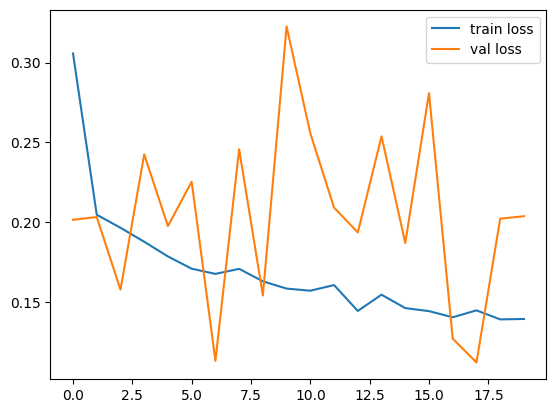

<Figure size 640x480 with 0 Axes>

In [23]:
plt.plot(model_vgg_history.history['loss'], label='train loss')
plt.plot(model_vgg_history.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

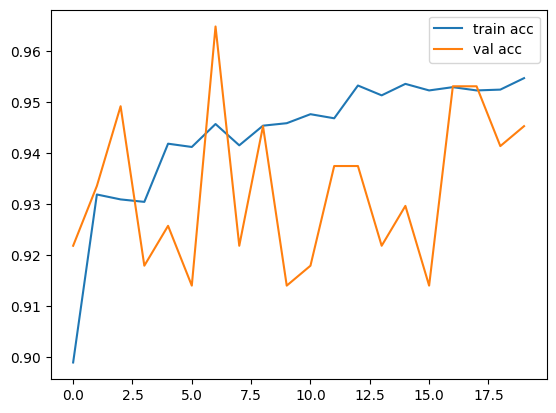

<Figure size 640x480 with 0 Axes>

In [24]:
# plot the accuracy
plt.plot(model_vgg_history.history['accuracy'], label='train acc')
plt.plot(model_vgg_history.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

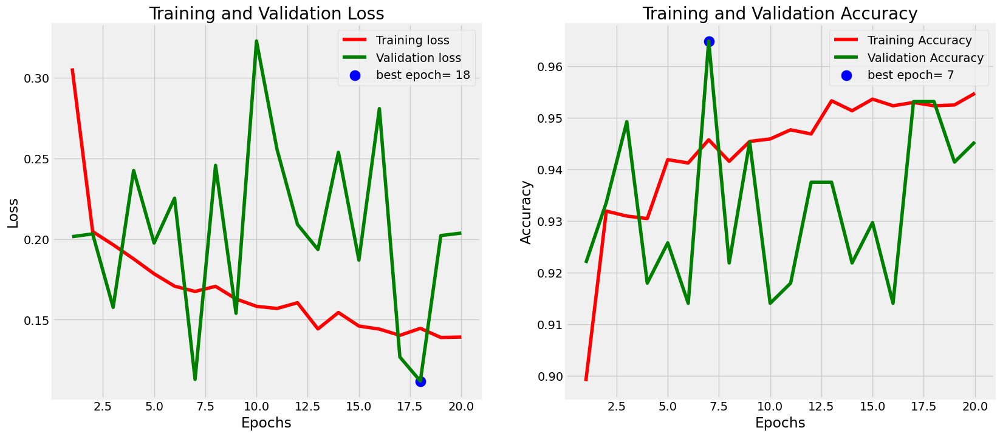

In [25]:
# Define needed variables
tr_acc = model_vgg_history.history['accuracy']
tr_loss =model_vgg_history.history['loss']
val_acc = model_vgg_history.history['val_accuracy']
val_loss = model_vgg_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

### Prediction

In [26]:
import numpy as np

def extract_data(generator):
    data_list = []
    labels_list = []
    for _ in range(generator.__len__()):
        data, labels = generator.next()
        data_list.append(data)
        labels_list.append(labels)
    x = np.vstack(data_list)
    y = np.vstack(labels_list)
    return x, y

x_train, y_train = extract_data(train_set)
x_test, y_test = extract_data(validation_set)

In [27]:
loss = model_vgg19.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

17/17 [==============================] - 4s 233ms/step - loss: 0.2051 - accuracy: 0.9379 - precision: 0.9379 - recall: 0.9379 - true_negatives: 498.0000
Test Acc: 0.9378530979156494


In [28]:
preds_vgg = model_vgg19.predict(x_test)
y_pred_vgg = np.argmax(preds_vgg , axis = 1 )

17/17 [==============================] - 2s 140ms/step


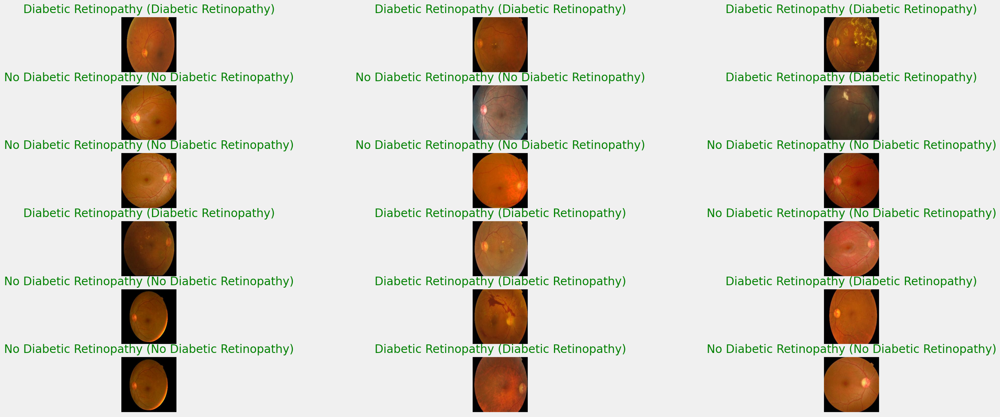

In [35]:
label_dict = {0 : 'Diabetic Retinopathy', 1 : 'No Diabetic Retinopathy'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=18)):
    ax = figure.add_subplot(6,3 , i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index_vgg = label_dict[(y_pred_vgg[index])]
    true_index_vgg = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index_vgg), 
                                  ( true_index_vgg)),
                                  color=("green" if predict_index_vgg == true_index_vgg else "red"))


In [95]:
model_vgg19.save('vgg19model.h5')

### Model Transfer Learning : Inception¶

In [36]:
from tensorflow.keras.applications import InceptionV3

In [37]:
inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

87910968/87910968 [==============================] - 30s 0us/step


In [40]:
for layer in inception.layers:
    print(layer)

In [41]:
model_inception = Sequential()

model_inception.add(inception)
model_inception.add(Flatten())
model_inception.add(Dropout(0.2))
model_inception.add(Dense(256,activation='relu'))
model_inception.add(Dropout(0.2))
model_inception.add(Dense(2,activation='softmax'))

In [42]:
model_inception.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_2 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_4 (Dropout)         (None, 51200)             0         
                                                                 
 dense_4 (Dense)             (None, 256)               13107456  
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 2)                 514       
                                                                 
Total params: 34910754 (133.17 MB)
Trainable params: 3

In [43]:
model_inception.compile(
    optimizer = Adam(lr=0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy',Precision(), Recall()]
  )

In [45]:
model_inception_history =model_inception.fit(
  train_set,
  validation_data=validation_set,
  epochs=EPOCHS,
  steps_per_epoch=len(train_set),
  validation_steps=len(test_set)
)

Epoch 1/20
195/195 [==============================] - 95s 302ms/step - loss: 1.6829 - accuracy: 0.8154 - precision_1: 0.8154 - recall_1: 0.8154 - val_loss: 2.4686 - val_accuracy: 0.4844 - val_precision_1: 0.4844 - val_recall_1: 0.4844
Epoch 2/20
195/195 [==============================] - 43s 221ms/step - loss: 0.3297 - accuracy: 0.9056 - precision_1: 0.9056 - recall_1: 0.9056 - val_loss: 0.2397 - val_accuracy: 0.9141 - val_precision_1: 0.9141 - val_recall_1: 0.9141
Epoch 3/20
195/195 [==============================] - 43s 221ms/step - loss: 0.2060 - accuracy: 0.9374 - precision_1: 0.9374 - recall_1: 0.9374 - val_loss: 0.1263 - val_accuracy: 0.9688 - val_precision_1: 0.9688 - val_recall_1: 0.9688
Epoch 4/20
195/195 [==============================] - 43s 221ms/step - loss: 0.1664 - accuracy: 0.9501 - precision_1: 0.9501 - recall_1: 0.9501 - val_loss: 0.1740 - val_accuracy: 0.9453 - val_precision_1: 0.9453 - val_recall_1: 0.9453
Epoch 5/20
195/195 [==============================] - 43s 22

### mInception Model Evaluation

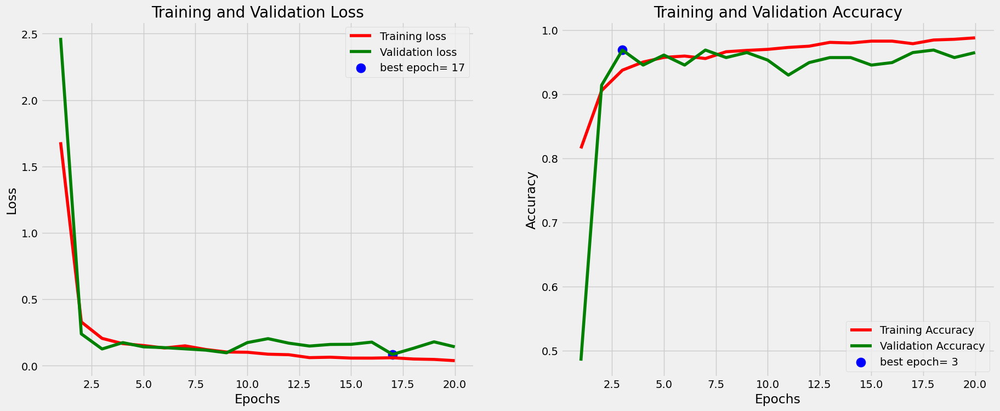

In [46]:
# Define needed variables
tr_acc = model_inception_history.history['accuracy']
tr_loss =model_inception_history.history['loss']
val_acc = model_inception_history.history['val_accuracy']
val_loss = model_inception_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [91]:
loss = model_inception.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

17/17 [==============================] - 1s 48ms/step - loss: 0.2285 - accuracy: 0.9605 - precision_1: 0.9605 - recall_1: 0.9605
Test Acc: 0.9604519605636597


In [92]:
preds_inception = model_inception.predict(x_test)
y_pred_inception = np.argmax(preds_vgg , axis = 1 )

17/17 [==============================] - 1s 44ms/step


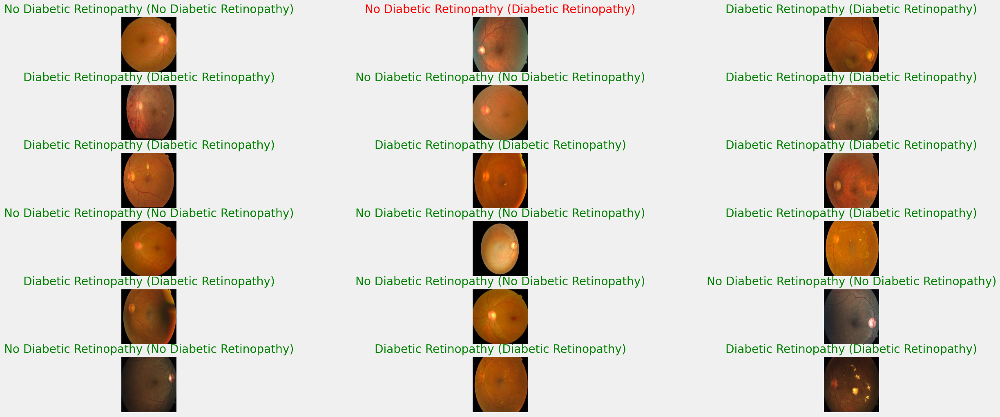

In [93]:
label_dict = {0 : 'Diabetic Retinopathy', 1 : 'No Diabetic Retinopathy'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=18)):
    ax = figure.add_subplot(6,3 , i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index_inception = label_dict[(y_pred_inception[index])]
    true_index_inception = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index_inception), 
                                  ( true_index_inception)),
                                  color=("green" if predict_index_inception == true_index_inception else "red"))


In [94]:
model_inception.save('inceptionmodel.h5')

### Model Transfer Learning : ResNet50

In [47]:
resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

94765736/94765736 [==============================] - 32s 0us/step


In [48]:
for layer in resnet.layers:
    print(layer)

In [49]:
model_resnet = Sequential()

model_resnet.add(inception)
model_resnet.add(Flatten())
model_resnet.add(Dropout(0.2))
model_resnet.add(Dense(256,activation='relu'))
model_resnet.add(Dropout(0.2))
model_resnet.add(Dense(2,activation='softmax'))

In [50]:
model_resnet.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_3 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_6 (Dropout)         (None, 51200)             0         
                                                                 
 dense_6 (Dense)             (None, 256)               13107456  
                                                                 
 dropout_7 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 2)                 514       
                                                                 
Total params: 34910754 (133.17 MB)
Trainable params: 3

In [51]:
model_resnet.compile(
    optimizer = Adam(lr=0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy',Precision(), Recall()]
  )

In [52]:
model_resnet_history =model_resnet.fit(
  train_set,
  validation_data=validation_set,
  epochs=EPOCHS,
  steps_per_epoch=len(train_set),
  validation_steps=len(test_set)
)

Epoch 1/20
195/195 [==============================] - 62s 224ms/step - loss: 0.3760 - accuracy: 0.9533 - precision_2: 0.9533 - recall_2: 0.9533 - val_loss: 33434.4609 - val_accuracy: 0.5039 - val_precision_2: 0.5039 - val_recall_2: 0.5039
Epoch 2/20
195/195 [==============================] - 43s 221ms/step - loss: 0.2208 - accuracy: 0.9581 - precision_2: 0.9581 - recall_2: 0.9581 - val_loss: 2.3643 - val_accuracy: 0.9531 - val_precision_2: 0.9531 - val_recall_2: 0.9531
Epoch 3/20
195/195 [==============================] - 43s 220ms/step - loss: 0.0878 - accuracy: 0.9730 - precision_2: 0.9730 - recall_2: 0.9730 - val_loss: 0.4750 - val_accuracy: 0.9648 - val_precision_2: 0.9648 - val_recall_2: 0.9648
Epoch 4/20
195/195 [==============================] - 43s 221ms/step - loss: 0.0566 - accuracy: 0.9803 - precision_2: 0.9803 - recall_2: 0.9803 - val_loss: 0.2323 - val_accuracy: 0.9531 - val_precision_2: 0.9531 - val_recall_2: 0.9531
Epoch 5/20
195/195 [==============================] - 43

### ResNet50 Model Evaluation

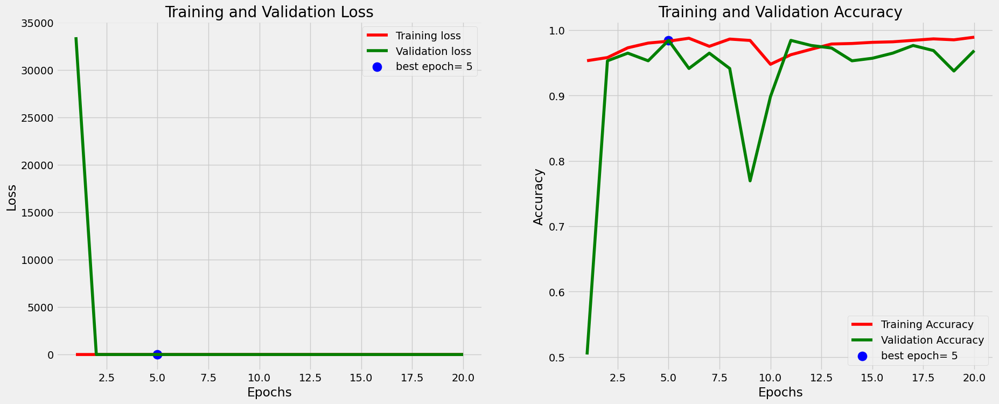

In [53]:
# Define needed variables
tr_acc = model_resnet_history.history['accuracy']
tr_loss = model_resnet_history.history['loss']
val_acc = model_resnet_history.history['val_accuracy']
val_loss = model_resnet_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()


In [87]:
loss = model_resnet.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

17/17 [==============================] - 1s 48ms/step - loss: 0.4141 - accuracy: 0.9605 - precision_2: 0.9605 - recall_2: 0.9605
Test Acc: 0.9604519605636597


In [88]:
preds_resnet = model_resnet.predict(x_test)
y_pred_resnet = np.argmax(preds_resnet , axis = 1 )

17/17 [==============================] - 2s 46ms/step


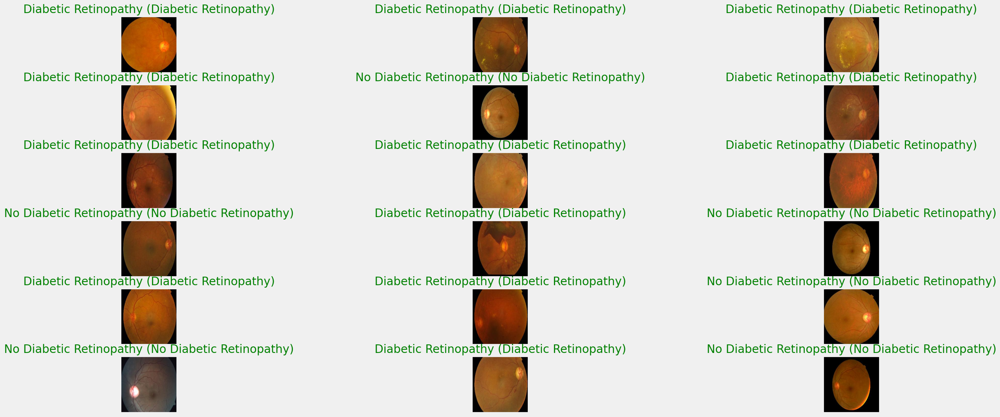

In [89]:
label_dict = {0 : 'Diabetic Retinopathy', 1 : 'No Diabetic Retinopathy'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=18)):
    ax = figure.add_subplot(6,3 , i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index_resnet = label_dict[(y_pred_resnet[index])]
    true_index_resnet = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index_resnet), 
                                  ( true_index_resnet)),
                                  color=("green" if predict_index_resnet == true_index_resnet else "red"))


In [90]:
model_resnet.save('resnetmodel.h5')

### Model Transfer Learning : EfficientNet

In [54]:
from tensorflow.keras.applications import EfficientNetB0
efficientnet = EfficientNetB0(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

16705208/16705208 [==============================] - 6s 0us/step


In [55]:
for layer in efficientnet.layers:
    print(layer)

In [56]:
model_efficientnet = Sequential()

model_efficientnet.add(inception)
model_efficientnet.add(Flatten())
model_efficientnet.add(Dropout(0.2))
model_efficientnet.add(Dense(512,activation='relu'))
model_efficientnet.add(Dropout(0.2))
model_efficientnet.add(Dense(2,activation='softmax'))

In [57]:
model_efficientnet.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_4 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_8 (Dropout)         (None, 51200)             0         
                                                                 
 dense_8 (Dense)             (None, 512)               26214912  
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 48018722 (183.18 MB)
Trainable params: 4

In [59]:
model_efficientnet.compile(
    optimizer = Adam(lr=0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy',Precision(), Recall()]
  )

In [60]:
model_efficientnet_history =model_efficientnet.fit(
  train_set,
  validation_data=validation_set,
  epochs=20,
  steps_per_epoch=len(train_set),
  validation_steps=len(test_set)
)

Epoch 1/20
195/195 [==============================] - 62s 224ms/step - loss: 0.3070 - accuracy: 0.9714 - precision_3: 0.9714 - recall_3: 0.9714 - val_loss: 0.8382 - val_accuracy: 0.8633 - val_precision_3: 0.8633 - val_recall_3: 0.8633
Epoch 2/20
195/195 [==============================] - 43s 222ms/step - loss: 0.3627 - accuracy: 0.9261 - precision_3: 0.9261 - recall_3: 0.9261 - val_loss: 0.2594 - val_accuracy: 0.9219 - val_precision_3: 0.9219 - val_recall_3: 0.9219
Epoch 3/20
195/195 [==============================] - 43s 222ms/step - loss: 0.1682 - accuracy: 0.9461 - precision_3: 0.9461 - recall_3: 0.9461 - val_loss: 0.1757 - val_accuracy: 0.9375 - val_precision_3: 0.9375 - val_recall_3: 0.9375
Epoch 4/20
195/195 [==============================] - 43s 222ms/step - loss: 0.0933 - accuracy: 0.9711 - precision_3: 0.9711 - recall_3: 0.9711 - val_loss: 0.1270 - val_accuracy: 0.9492 - val_precision_3: 0.9492 - val_recall_3: 0.9492
Epoch 5/20
195/195 [==============================] - 43s 22

### Efficientnet Model Evaluation

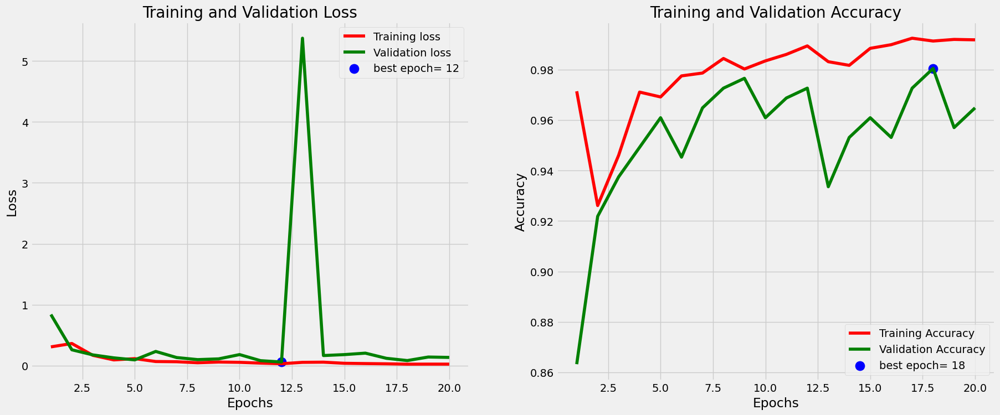

In [61]:
# Define needed variables
tr_acc = model_efficientnet_history.history['accuracy']
tr_loss = model_efficientnet_history.history['loss']
val_acc = model_efficientnet_history.history['val_accuracy']
val_loss = model_efficientnet_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [82]:
loss = model_efficientnet.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

17/17 [==============================] - 1s 49ms/step - loss: 0.1032 - accuracy: 0.9736 - precision_3: 0.9736 - recall_3: 0.9736
Test Acc: 0.973634660243988


In [83]:
preds_efficient = model_efficientnet.predict(x_test)
y_pred_efficient = np.argmax(preds_efficient , axis = 1 )

17/17 [==============================] - 2s 46ms/step


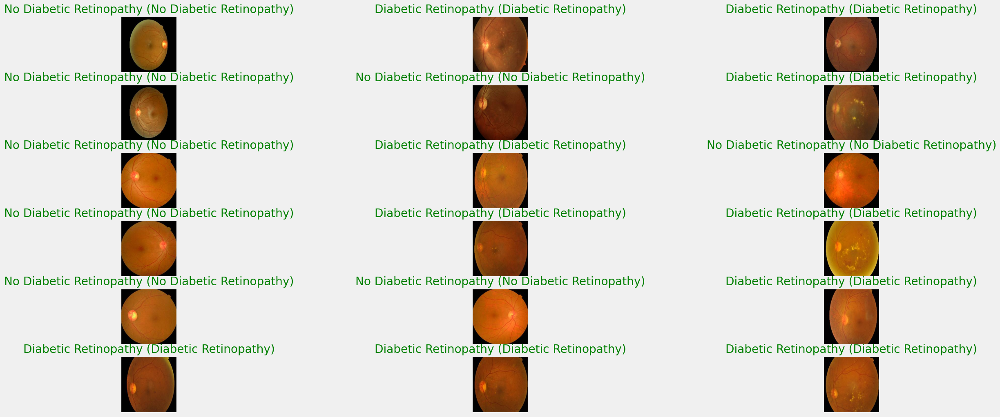

In [85]:
label_dict = {0 : 'Diabetic Retinopathy', 1 : 'No Diabetic Retinopathy'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=18)):
    ax = figure.add_subplot(6,3 , i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index_efficient = label_dict[(y_pred_efficient[index])]
    true_index_efficient = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index_efficient), 
                                  ( true_index_efficient)),
                                  color=("green" if predict_index_efficient == true_index_efficient else "red"))


In [86]:
model_efficientnet.save('efficientnetmodel.h5')

### Model Transfer Learning : MobileNet

In [71]:
from tensorflow.keras.applications import MobileNet
mobilenet = MobileNet(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [72]:
for layer in mobilenet.layers:
    print(layer)

In [73]:
model_mobilenet = Sequential()

model_mobilenet.add(inception)
model_mobilenet.add(Flatten())
model_mobilenet.add(Dropout(0.2))
model_mobilenet.add(Dense(512,activation='relu'))
model_mobilenet.add(Dropout(0.2))
model_mobilenet.add(Dense(2,activation='softmax'))

In [74]:
model_mobilenet.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_6 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_12 (Dropout)        (None, 51200)             0         
                                                                 
 dense_12 (Dense)            (None, 512)               26214912  
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_13 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 48018722 (183.18 MB)
Trainable params: 4

In [75]:
model_mobilenet.compile(
    optimizer = Adam(lr=0.001), 
    loss='categorical_crossentropy', 
    metrics=['accuracy',Precision(), Recall()]
  )

In [76]:
model_mobilenet_history =model_mobilenet.fit(
  train_set,
  validation_data=validation_set,
  epochs= EPOCHS,
  steps_per_epoch=len(train_set),
  validation_steps=len(test_set)
)

Epoch 1/20
195/195 [==============================] - 62s 224ms/step - loss: 0.0553 - accuracy: 0.9814 - precision_5: 0.9814 - recall_5: 0.9814 - val_loss: 0.1564 - val_accuracy: 0.9688 - val_precision_5: 0.9688 - val_recall_5: 0.9688
Epoch 2/20
195/195 [==============================] - 43s 220ms/step - loss: 0.0427 - accuracy: 0.9872 - precision_5: 0.9872 - recall_5: 0.9872 - val_loss: 0.1543 - val_accuracy: 0.9531 - val_precision_5: 0.9531 - val_recall_5: 0.9531
Epoch 3/20
195/195 [==============================] - 43s 221ms/step - loss: 0.0349 - accuracy: 0.9886 - precision_5: 0.9886 - recall_5: 0.9886 - val_loss: 0.2250 - val_accuracy: 0.9531 - val_precision_5: 0.9531 - val_recall_5: 0.9531
Epoch 4/20
195/195 [==============================] - 43s 222ms/step - loss: 0.0266 - accuracy: 0.9902 - precision_5: 0.9902 - recall_5: 0.9902 - val_loss: 0.2698 - val_accuracy: 0.9570 - val_precision_5: 0.9570 - val_recall_5: 0.9570
Epoch 5/20
195/195 [==============================] - 43s 22

### Mobilenet Model Evaluation

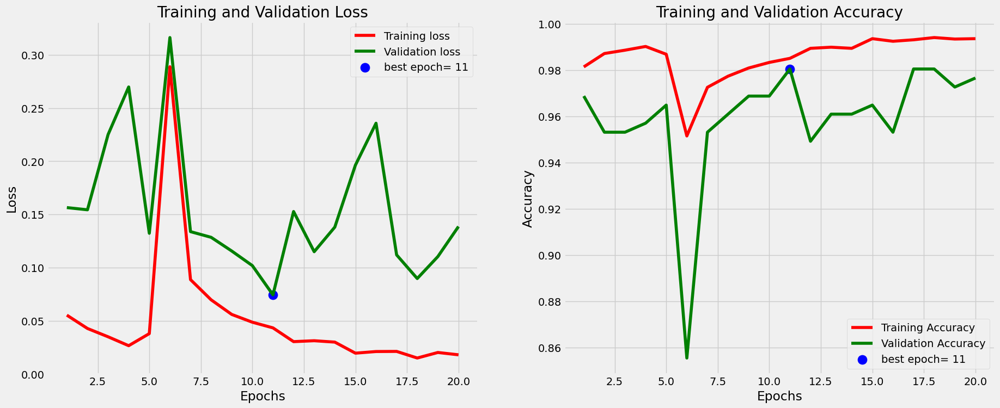

In [77]:
# Define needed variables
tr_acc = model_mobilenet_history.history['accuracy']
tr_loss = model_mobilenet_history.history['loss']
val_acc = model_mobilenet_history.history['val_accuracy']
val_loss = model_mobilenet_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [78]:
loss = model_mobilenet.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

17/17 [==============================] - 3s 206ms/step - loss: 0.1288 - accuracy: 0.9736 - precision_5: 0.9736 - recall_5: 0.9736
Test Acc: 0.973634660243988


In [79]:
preds_mob = model_mobilenet.predict(x_test)
y_pred_mob = np.argmax(preds_mob , axis = 1 )

17/17 [==============================] - 2s 46ms/step


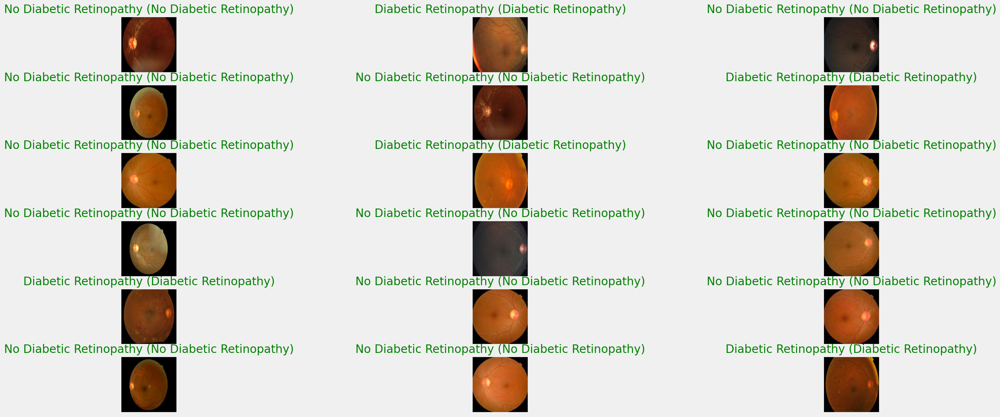

In [80]:
label_dict = {0 : 'Diabetic Retinopathy', 1 : 'No Diabetic Retinopathy'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=18)):
    ax = figure.add_subplot(6,3 , i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index_mob = label_dict[(y_pred_mob[index])]
    true_index_mob = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index_mob), 
                                  ( true_index_mob)),
                                  color=("green" if predict_index_mob == true_index_mob else "red"))


In [81]:
model_mobilenet.save('mobilenetmodel.h5')

/home/salmanahmad/.local/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
